# Anomaly detection using Isolation Forest

In [ ]:
!pip3 install filterpy==1.4.5 --quiet
!pip3 install PyWavelets==1.8.0 --quiet

In [2]:
import numpy as np
import pandas as pd

import seaborn as sns
import plotly.graph_objects as go

from scipy.stats import zscore
from sklearn.cluster import AgglomerativeClustering
from sklearn.ensemble import IsolationForest

INPUT_FILE_PATH="data/cesnet-time-series24"

## Isolation Forest

[Isolation Forest](https://www.digitalocean.com/community/tutorials/anomaly-detection-isolation-forest) (IF) is an algorithm for anomaly detection. It works on the principle of isolating outliers. It is based on the [Decision Tree algorithm](https://en.wikipedia.org/wiki/Decision_tree).

I chose this algorithm because the CESNET dataset contains a relatively large number of **features/metrics**. It is very likely that an anomaly will affect several of these metrics, so it might make sense to look at the relationships of these properties to more accurately identify possible anomalies.

One significant issue, however, is which feature metrics to select. If all features are selected, the results are not very good because not all features are affected by potential anomalies and these can mislead the results. Therefore, it is advisable to cluster the features by some technique and use IF on these groups of features.


**The procedure of the algorithm is as follows:**

1. **Derived features are created.** According to paper [Web Traffic Anomaly Detection Using Isolation Forest](https://doi.org/10.3390/informatics11040083) by Wilson Chua et. al., the IF algorithm can perform better if derived metrics are added. For example, if we have the ratio of packet direction (`dir_ratio_packets`) and the number of bytes (`n_bytes`), we can derive the number of inbound and outbound bytes. According to the results, this approach can really improve the results.

2. **For each feature, the z-score is calculated.** The z-score is an initial attempt to determine potential anomalies. For each value, it determines the relationship to the overall mean. This results in data with a normal distribution with a mean of 0 and a standard deviation of 1.

3. **A correlation table between the z-scores is created and clusters are formed using the `AgglomerativeClustering` algorithm.** Features with similar z-scores will have a high correlation and are likely to be assigned to the same group.

4. **Split the data into training and test, create a model and prediction for each group of features.** The data is not normalized because the IF algorithm does not require it and the results with normalized data were not different.

5. Test data are displayed in two ways. The first is a time series with individual features and anomalies (red points) and the second way is a pairplot graph showing individual pairs in groups and their values/outliers.


The results of the algorithm are mainly affected by two values. The first is the **expected level of anomalies** (`expected_contamination`) the larger it is the more potential anomalies are detected. It is a good idea to set this number according to the context of the network being monitored, if there are few anomalies on the network it can be set low. For example, `expected_contamination` = 0.006 implies that 0.6% of the values are anomalies. The second value is **the level of differences in the created clusters** (`clustering_ratio`).  Larger values of `clustering_ratio`, **1 to 1.8**, will create fewer groups while values of **0.2 to 1** will create many groups. Again, this depends on the context of the features.


**Problems and room for improvement:**

The `expected_contamination` and `clustering_ratio` parameters can be set automaticaly. Estimation of these values can be based on history or context.

As for `clustering_ratio`, it can also be hard coded. It can be expected that some properties will always affect each other, for example the number of bytes and packets transferred. However, I have chosen an automated approach.

The clustering feature can be quite a bit better. I have used generic functions that may not be optimal for this purpose. The composition of the individual groups can have a big impact on the result, so optimization in this direction is appropriate.

The result are anomalies as single points. These could be grouped together to identify the beginning of the anomaly or just the point anomalies.


In [ ]:
# Definitions of help functions and classes

def load_series(input_file_path:str, aggregation_rate:str, aggregation_level:str, data_id=int) -> pd.DataFrame:
    # Load times
    time_ids = pd.read_csv(f"{input_file_path}/times/times_{aggregation_rate[4:]}.csv")
    time_ids['time'] = pd.to_datetime(time_ids['time']) # convert time to datetime
    time_map = dict(zip(time_ids['id_time'], time_ids['time']))

    # Load data
    df = pd.read_csv(f"{input_file_path}/{aggregation_level}/{aggregation_rate}/{str(data_id)}.csv")
    df['time'] = df['id_time'].map(time_map)
    return df



In [ ]:
# Isolation Forest

def add_derived_features(data:pd.DataFrame):
    
    def ignore_exception(func, data, col_name):
        try:
            data[col_name] = func()
        except Exception:
            pass

    ignore_exception(lambda: data['n_packets'] * (1 - data['dir_ratio_packets']), data, 'inbound_packets')
    ignore_exception(lambda: data['n_packets'] * data['dir_ratio_packets'], data, 'outbound_packets')
    ignore_exception(lambda: data['n_bytes'] * (1 - data['dir_ratio_bytes']), data, 'inbound_bytes')
    ignore_exception(lambda: data['n_bytes'] * data['dir_ratio_bytes'], data, 'outbound_bytes')
    ignore_exception(lambda: data['n_packets'] * data['tcp_udp_ratio_packets'], data, 'tcp_packets')
    ignore_exception(lambda: data['n_packets'] * (1 - data['tcp_udp_ratio_packets']), data, 'udp_packets')
    ignore_exception(lambda: data['n_packets'] / data['n_flows'], data, 'avg_packets_per_flow')
    ignore_exception(lambda: data['n_bytes'] / data['n_packets'], data, 'avg_bytes_per_packet')
    ignore_exception(lambda: data['sum_n_dest_ip'] / data['n_flows'], data, 'ips_per_flow')
    ignore_exception(lambda: data['sum_n_dest_port'] / data['n_flows'], data, 'ports_per_flow')
    ignore_exception(lambda: data['sum_n_dest_asn'] / data['n_flows'], data, 'avg_asn_per_flow')
    return data


def get_z_scores(data:pd.DataFrame):
    return data.apply(zscore)


def cluster_features(z_scores:pd.DataFrame, clustering_ratio:float):
    corr_matrix = z_scores.corr(method="pearson")
    clustering = AgglomerativeClustering(n_clusters=None, distance_threshold=clustering_ratio, linkage="ward", metric="euclidean")
    cluster_ids = clustering.fit_predict(corr_matrix)
    label_dict = {}
    for label, cluster_id in zip(list(z_scores.keys()), cluster_ids):
        if cluster_id in label_dict:
            label_dict[cluster_id].append(label)
        else:
            label_dict[cluster_id] = [label]
        
    return list(label_dict.values())


def split_data(data:pd.DataFrame, ratio:float=0.5):
    split = int(len(data) * ratio)
    return data[:split], data[split:]


def train_model(train_data:pd.DataFrame, features, expected_contamination):
    model = IsolationForest(contamination=expected_contamination, random_state=42)
    model.fit(train_data[features])
    return model


def show_pairplot_graphs(df, features):
    palette = ["#ff7f0e", "#1f77b4"]
    sns.pairplot(df, vars=features, hue="anomaly", palette=palette)


def find_anomalies(data:pd.DataFrame, expected_contamination:float=0.01, clustering_ratio:float=1.2, features:list[str]|None=None, derive_features:bool=False):
    # Select features
    if features is not None:
        data = data[(features + ['id_time', 'time'])]

    # Derive new features
    if derive_features:
        data = add_derived_features(data)

    # Final features list
    all_features = [feature for feature in list(data.keys()) if feature not in ['id_time', 'time']]

    # Split data for training and testing
    train_data, test_data = split_data(data.copy(), ratio=0.5)
    
    # Calculate z-scores
    z_scores = get_z_scores(train_data[all_features])

    # Cluster features
    feature_clusters = cluster_features(z_scores, clustering_ratio)

    # Make Isolation forest model for each feature cluster and find anomalies
    anomaly_dfs:list[tuple[list[str], pd.DataFrame]] = []
    for feature_cluster in feature_clusters:
        result = test_data.copy()[(feature_cluster + ['id_time', 'time'])]
        model = train_model(train_data, feature_cluster, expected_contamination)
        result['anomaly'] = model.predict(test_data[feature_cluster])
        anomaly_dfs.append((feature_cluster, result))
    
    return anomaly_dfs


def show_bar_graphs(anomaly_dfs:list[tuple[list[str], pd.DataFrame]]):
    all_features = []
    initial_feature = anomaly_dfs[0][0][0]  # Show first feature initially
    fig = go.Figure()
    for features, anomly_df in anomaly_dfs:
        all_features += features
        for feature in features:
            fig.add_trace(go.Bar(
                x=anomly_df['time'],
                y=anomly_df[feature],
                name=feature,
                marker=dict(line=dict(width=0)),
                visible=(feature == initial_feature),
            ))
            # Add anomaly points
            fig.add_trace(go.Scatter(
                x=anomly_df.loc[anomly_df['anomaly'] == -1, 'time'],
                y=anomly_df.loc[anomly_df['anomaly'] == -1, feature],
                mode='markers',
                marker=dict(color='red', size=8),
                name=f'Anomalies - {feature}',
                
                visible=(feature == initial_feature)
            ))
        
    # Create dropdown buttons
    buttons = []
    for i, feature in enumerate(all_features):
        visibility = [False] * (2 * len(all_features))  # Each feature has 2 traces
        visibility[i*2:i*2+2] = [True, True]  # Set only this feature visible
        
        buttons.append(dict(
            label=feature,
            method='update',
            args=[{'visible': visibility}, {'title': f"Results for {feature}"}]
    ))
    # Update layout with dropdown
    fig.update_layout(
        title=f'Results for {initial_feature}',
        updatemenus=[{
            "buttons": buttons,
            "direction": "down",
            "showactive": True,
        }],
        xaxis_title="Time",
        yaxis_title="Value"
    )    
    fig.show()

## Subnet 36

Feature cluster: ['n_flows']
Feature cluster: ['n_packets', 'inbound_packets', 'outbound_packets', 'tcp_packets', 'udp_packets']


/home/miski/Dokumenty/school/PDS/projekt/PDS-project/.venv/lib/python3.12/site-packages/seaborn/axisgrid.py:1513: UserWarning: The palette list has more values (2) than needed (1), which may not be intended.
  func(x=vector, **plot_kwargs)


Feature cluster: ['n_bytes', 'inbound_bytes', 'outbound_bytes', 'avg_packets_per_flow']
Feature cluster: ['sum_n_dest_asn', 'average_n_dest_asn']


/home/miski/Dokumenty/school/PDS/projekt/PDS-project/.venv/lib/python3.12/site-packages/seaborn/axisgrid.py:1513: UserWarning: The palette list has more values (2) than needed (1), which may not be intended.
  func(x=vector, **plot_kwargs)
/home/miski/Dokumenty/school/PDS/projekt/PDS-project/.venv/lib/python3.12/site-packages/seaborn/axisgrid.py:1513: UserWarning: The palette list has more values (2) than needed (1), which may not be intended.
  func(x=vector, **plot_kwargs)
/home/miski/Dokumenty/school/PDS/projekt/PDS-project/.venv/lib/python3.12/site-packages/seaborn/axisgrid.py:1615: UserWarning: The palette list has more values (2) than needed (1), which may not be intended.
  func(x=x, y=y, **kwargs)
/home/miski/Dokumenty/school/PDS/projekt/PDS-project/.venv/lib/python3.12/site-packages/seaborn/axisgrid.py:1615: UserWarning: The palette list has more values (2) than needed (1), which may not be intended.
  func(x=x, y=y, **kwargs)


Feature cluster: ['std_n_dest_asn', 'sum_n_dest_ip', 'average_n_dest_ip', 'std_n_dest_ip']


/home/miski/Dokumenty/school/PDS/projekt/PDS-project/.venv/lib/python3.12/site-packages/seaborn/axisgrid.py:1513: UserWarning: The palette list has more values (2) than needed (1), which may not be intended.
  func(x=vector, **plot_kwargs)
/home/miski/Dokumenty/school/PDS/projekt/PDS-project/.venv/lib/python3.12/site-packages/seaborn/axisgrid.py:1513: UserWarning: The palette list has more values (2) than needed (1), which may not be intended.
  func(x=vector, **plot_kwargs)
/home/miski/Dokumenty/school/PDS/projekt/PDS-project/.venv/lib/python3.12/site-packages/seaborn/axisgrid.py:1513: UserWarning: The palette list has more values (2) than needed (1), which may not be intended.
  func(x=vector, **plot_kwargs)
/home/miski/Dokumenty/school/PDS/projekt/PDS-project/.venv/lib/python3.12/site-packages/seaborn/axisgrid.py:1513: UserWarning: The palette list has more values (2) than needed (1), which may not be intended.
  func(x=vector, **plot_kwargs)
/home/miski/Dokumenty/school/PDS/projekt

Feature cluster: ['sum_n_dest_ports', 'average_n_dest_ports']
Feature cluster: ['std_n_dest_ports']
Feature cluster: ['tcp_udp_ratio_packets', 'tcp_udp_ratio_bytes']
Feature cluster: ['dir_ratio_packets', 'dir_ratio_bytes']
Feature cluster: ['avg_duration']
Feature cluster: ['avg_ttl']
Feature cluster: ['avg_bytes_per_packet']
Feature cluster: ['ips_per_flow', 'avg_asn_per_flow']


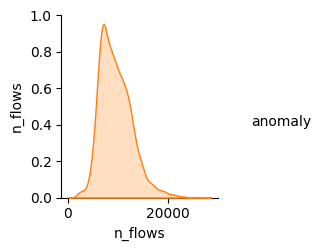

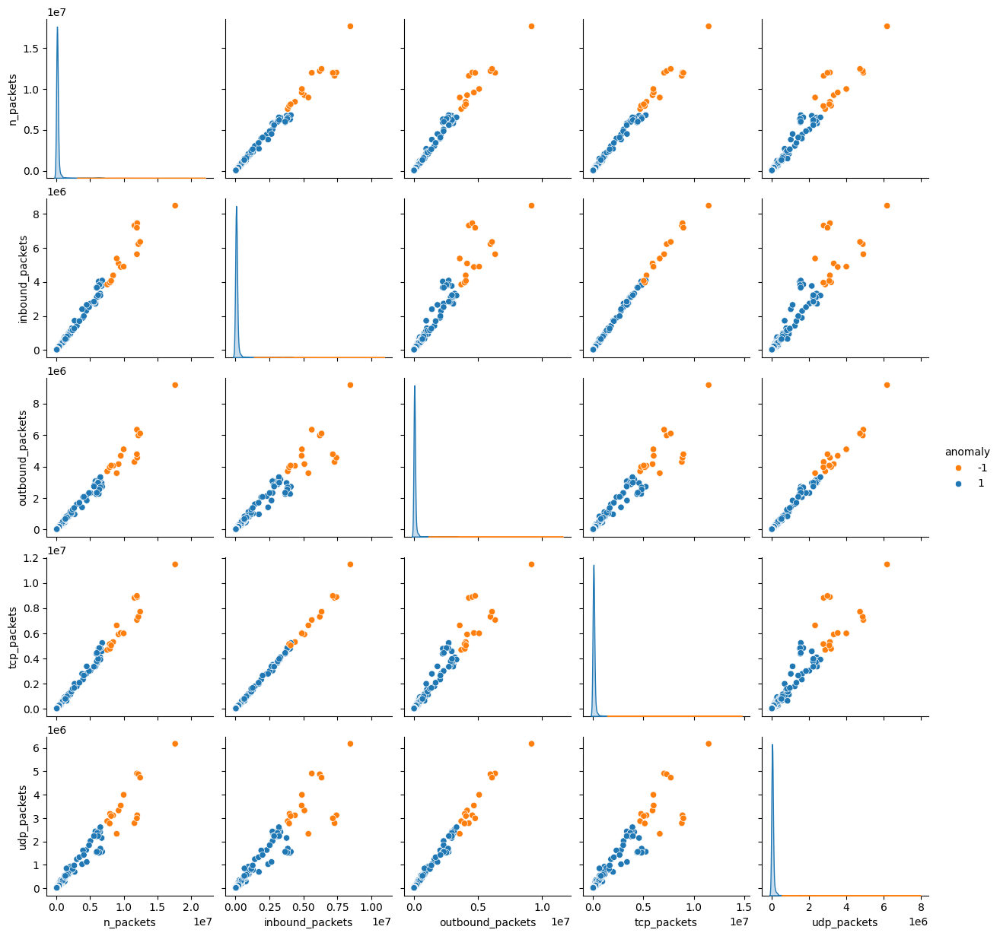

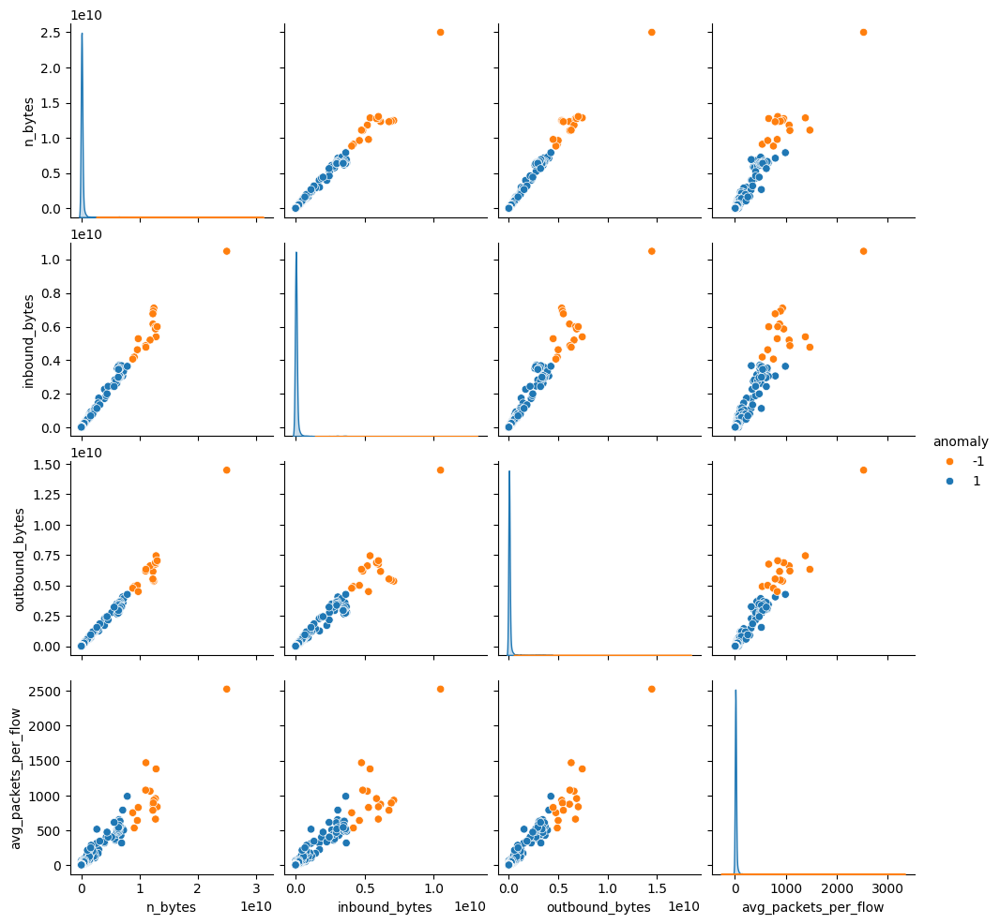

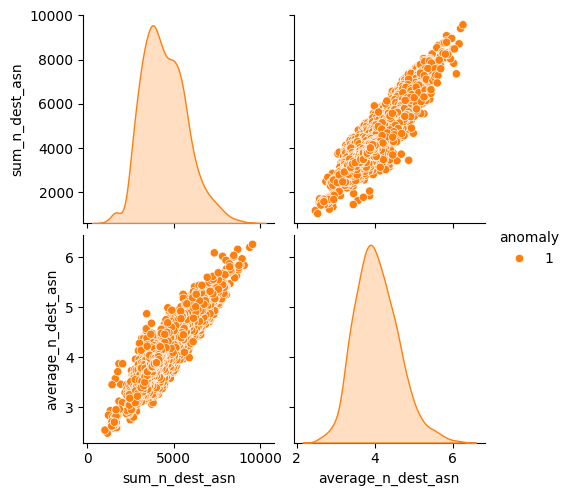

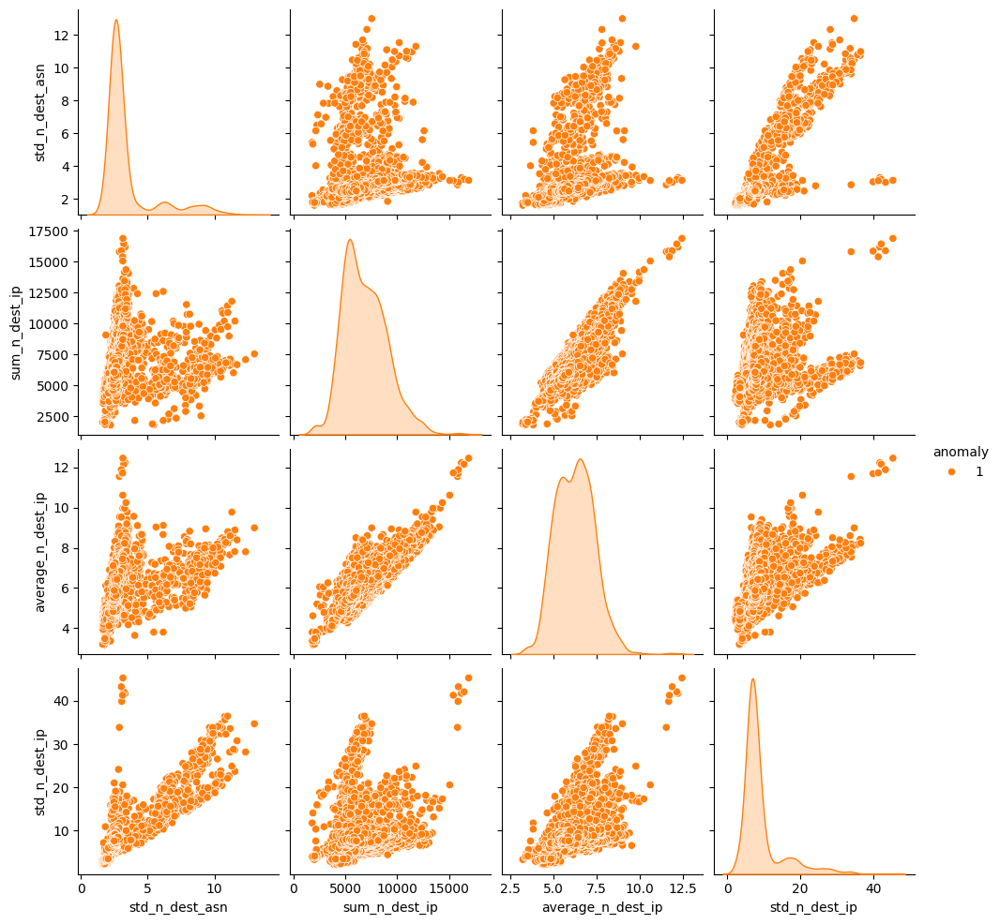

...

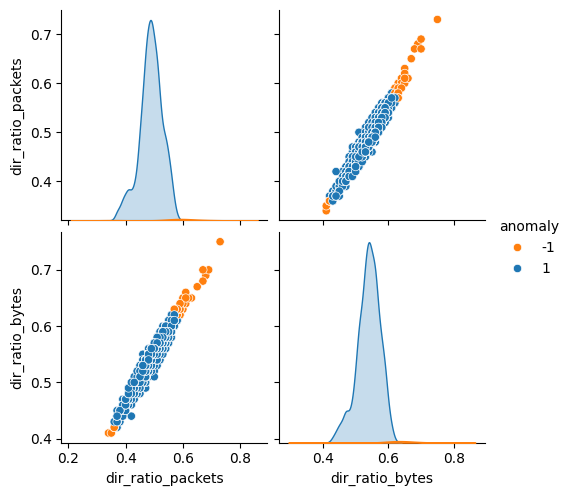

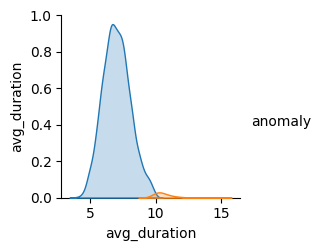

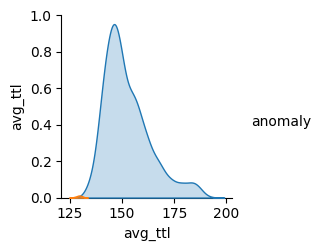

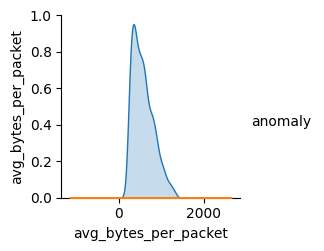

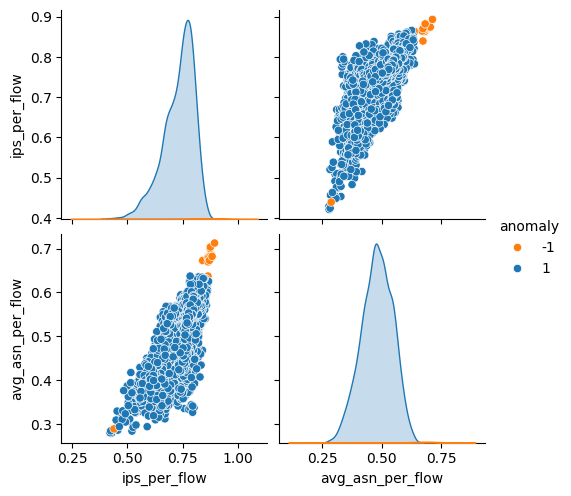

In [5]:
AGG_RATE = "agg_1_hour"
AGG_LEVEL = "institutions" # can be institutions or institution_subnets or ip_addresses_sample
AGG_LEVEL = "institution_subnets" # can be institutions or institution_subnets or ip_addresses_sample
DATA_ID = 36

features = ["n_packets", "n_bytes", "std_n_dest_ip", "sum_n_dest_ports", "dir_ratio_packets", "avg_duration"]
df:pd.DataFrame = load_series(INPUT_FILE_PATH, AGG_RATE, AGG_LEVEL, DATA_ID)

anomaly_dfs = find_anomalies(df, 0.006, 0.8, derive_features=True)
all_features = []

for cluster, anomaly_df in anomaly_dfs:
    all_features += cluster
    print(f"Feature cluster: {cluster}")
    show_pairplot_graphs(anomaly_df, cluster)

show_bar_graphs(anomaly_dfs)

## IP 1367

Feature cluster: ['n_flows', 'sum_n_dest_asn', 'average_n_dest_asn', 'sum_n_dest_ip', 'average_n_dest_ip']
Feature cluster: ['n_packets', 'n_bytes', 'inbound_packets', 'outbound_packets', 'inbound_bytes', 'tcp_packets']
Feature cluster: ['std_n_dest_asn', 'std_n_dest_ip']
Feature cluster: ['sum_n_dest_ports', 'average_n_dest_ports']
Feature cluster: ['std_n_dest_ports']
Feature cluster: ['tcp_udp_ratio_packets', 'tcp_udp_ratio_bytes']
Feature cluster: ['dir_ratio_packets', 'dir_ratio_bytes']
Feature cluster: ['avg_duration']
Feature cluster: ['avg_ttl']
Feature cluster: ['outbound_bytes', 'avg_packets_per_flow']
Feature cluster: ['udp_packets']
Feature cluster: ['avg_bytes_per_packet']
Feature cluster: ['ips_per_flow']
Feature cluster: ['avg_asn_per_flow']


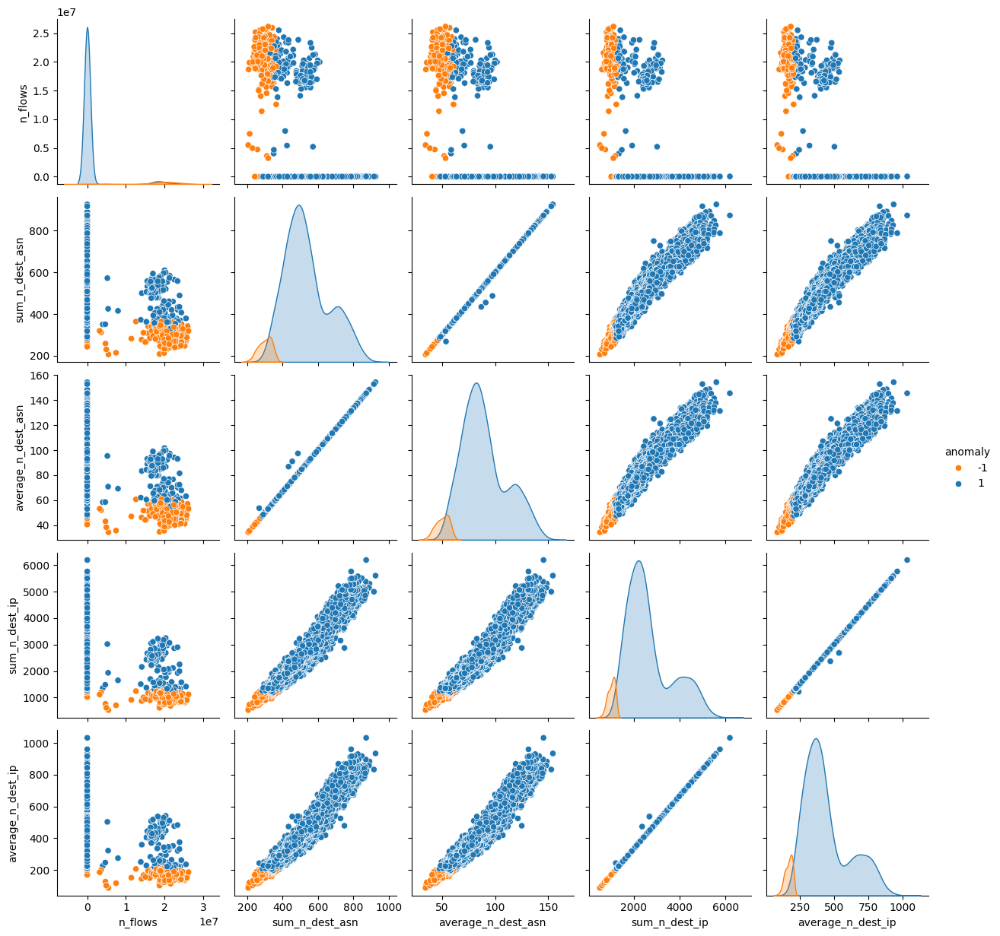

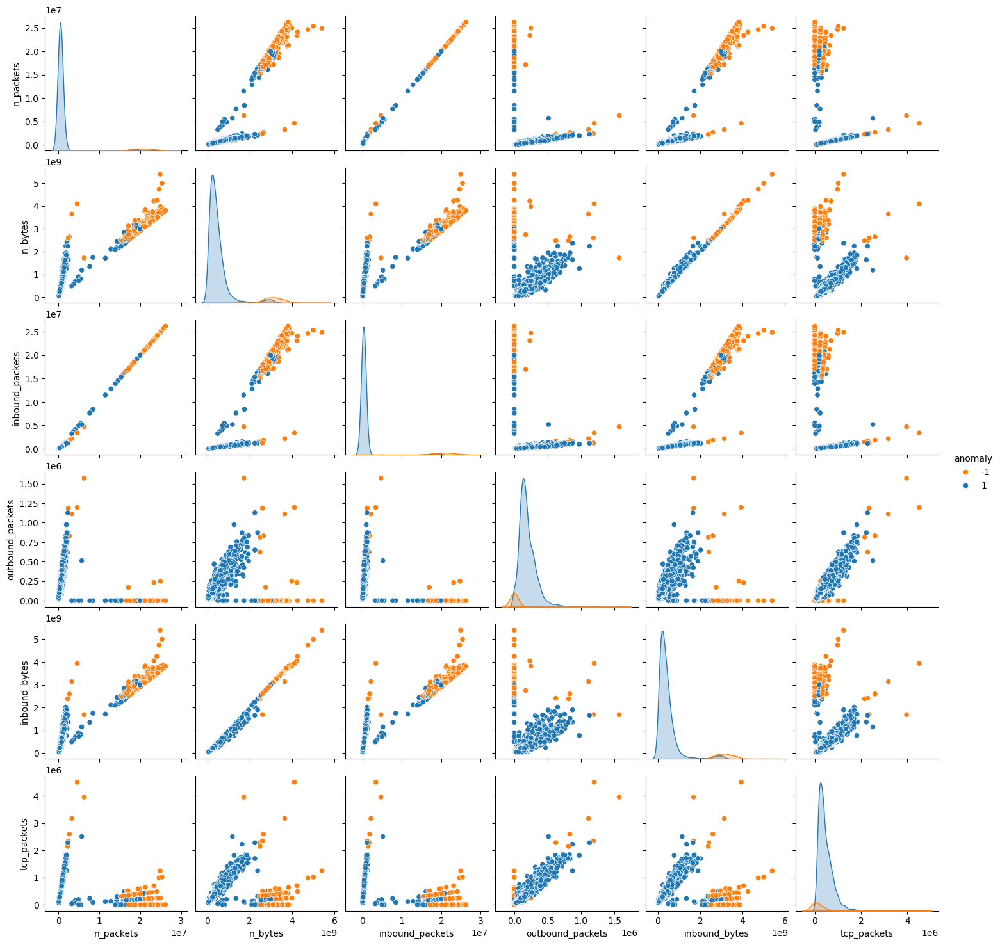

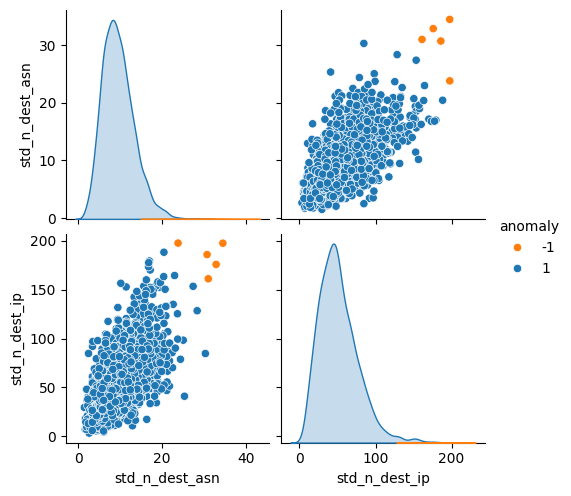

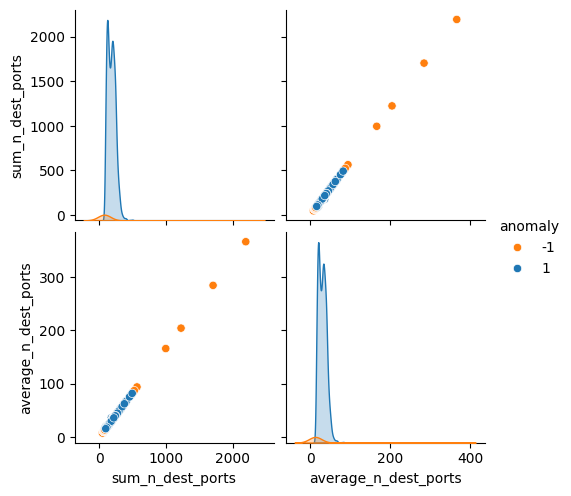

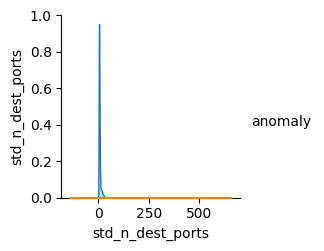

...

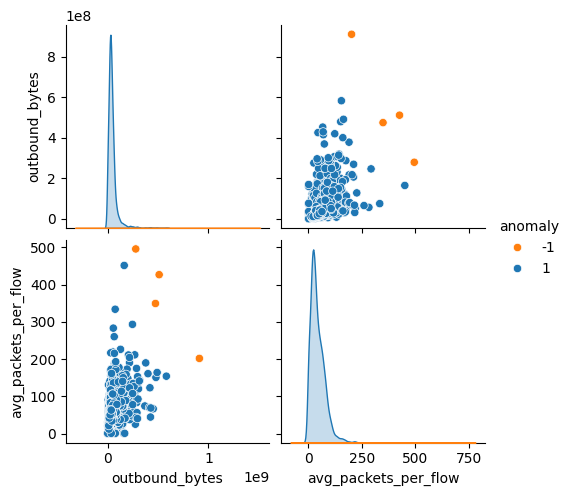

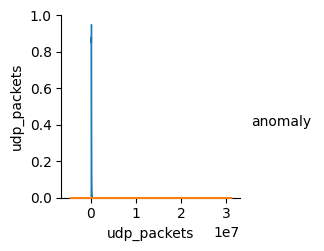

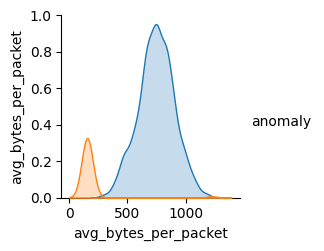

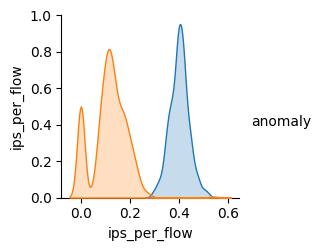

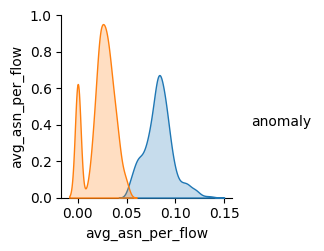

In [6]:
AGG_RATE = "agg_1_hour"
AGG_LEVEL = "ip_addresses_sample" # can be institutions or institution_subnets or ip_addresses_sample
DATA_ID = 1367

features = ["n_packets", "n_bytes", "std_n_dest_ip", "sum_n_dest_ports", "dir_ratio_packets", "avg_duration"]
df:pd.DataFrame = load_series(INPUT_FILE_PATH, AGG_RATE, AGG_LEVEL, DATA_ID)

anomaly_dfs = find_anomalies(df, 0.006, 1.4, derive_features=True)
all_features = []

for cluster, anomaly_df in anomaly_dfs:
    all_features += cluster
    print(f"Feature cluster: {cluster}")
    show_pairplot_graphs(anomaly_df, cluster)

show_bar_graphs(anomaly_dfs)